In [1]:
import cv2
import math
import image_generator
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import feature_extractor
from scipy import ndimage
import cv2

In [2]:
'''data = pd.read_csv('top-1_first_bin.csv')
data.head()'''

"data = pd.read_csv('top-1_first_bin.csv')\ndata.head()"

<font size="5">**KP_surf**</font>

<font size="3">The following methods were tested for extraction of the <font color = "green">number of keypoints</font>. Since they are computed with methods defined in the *cv2* library, they most likely *can't* be the source of error.</font>

In [3]:
img = cv2.imread('ILSVRC2012_val_00000001.JPEG')

# 1st way - ORB
def kp_orb(img):
    orb = cv2.ORB_create(100000) 
    keypoints = orb.detect(img, None)
    kp_orb = len(keypoints)
    return kp_orb

#2nd way - SURF
def kp_surf(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    surf = cv2.xfeatures2d.SURF_create() 
    keypoints = surf.detect(img_gray, None)
    kp_surf = len(keypoints)
    return kp_surf

#3rd way - SIFT
def kp_sift(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sift = cv2.xfeatures2d.SIFT_create() 
    keypoints = sift.detect(img_gray, None)
    kp_sift = len(keypoints)
    return kp_sift

In [4]:
image_generator.main()
imgGen = image_generator.ImageGenerator('images/val/images', 'images/val/val.txt', 'images/val/synset_words.txt')

img_nums = []

# images to demonstrate
img_nums = [x for x in range(1, 31)]

img_path_list = []
for i in range(len(img_nums)):
    img_path, _ = imgGen.get_image_data(img_nums[i])
    img_path_list.append(img_path)

# reading the images in
imgs = []
for i in range(len(img_path_list)):
    img = cv2.imread(img_path_list[i], 3)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # converting to proper color scheme for plt.imshow() 
    imgs.append(img)

images/val/images\ILSVRC2012_val_00033668.JPEG hog, pig, grunter, squealer, Sus scrofa
images/val/images\ILSVRC2012_val_00043314.JPEG wig
images/val/images\ILSVRC2012_val_00031838.JPEG moving van
images/val/images\ILSVRC2012_val_00038185.JPEG sunglass
images/val/images\ILSVRC2012_val_00048330.JPEG Doberman, Doberman pinscher
images/val/images\ILSVRC2012_val_00020887.JPEG hatchet
images/val/images\ILSVRC2012_val_00005458.JPEG amphibian, amphibious vehicle
images/val/images\ILSVRC2012_val_00023954.JPEG black widow, Latrodectus mactans
images/val/images\ILSVRC2012_val_00007560.JPEG web site, website, internet site, site
images/val/images\ILSVRC2012_val_00004490.JPEG trolleybus, trolley coach, trackless trolley


<font size="5">**Comparing kp_orb, kp_surf and kp_sift for first 30 images**</font>

In [5]:
img_kps_orb = [kp_orb(img) for img in imgs] 
img_kps_surf = [kp_surf(img) for img in imgs] 
img_kps_sift = [kp_sift(img) for img in imgs] 

In [6]:
from scipy.stats import pearsonr

# calculate Pearson's correlation
corr, _ = pearsonr(img_kps_orb, img_kps_surf)
print('Pearsons correlation for kp_orb and kp_surf: %.3f' % corr)
corr, _ = pearsonr(img_kps_surf, img_kps_sift)
print('Pearsons correlation for kp_surf and kp_sift: %.3f' % corr)
corr, _ = pearsonr(img_kps_orb, img_kps_sift)
print('Pearsons correlation for kp_orb and kp_sift: %.3f' % corr)

Pearsons correlation for kp_orb and kp_surf: 0.954
Pearsons correlation for kp_surf and kp_sift: 0.607
Pearsons correlation for kp_orb and kp_sift: 0.581


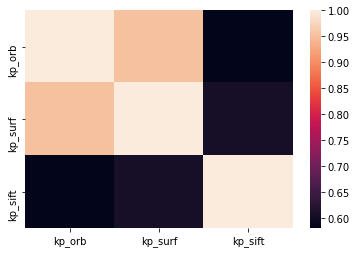

In [7]:
import seaborn as sns

img_kps_orb = np.array(img_kps_orb)
img_kps_surf = np.array(img_kps_surf)
img_kps_sift = np.array(img_kps_sift)

img_kp = np.append(img_kps_orb.reshape(30, 1), img_kps_surf.reshape(30, 1), axis = 1)
img_kp = np.append(img_kp, img_kps_sift.reshape(30, 1), axis = 1)

df = pd.DataFrame(data = img_kp, columns = ['kp_orb', 'kp_surf', 'kp_sift'])

corr = df.corr()
sns.heatmap(corr)
plt.show()

<font size="3">It can be seen that *kp_orb* and *kp_surf* are similar with a high correlation coefficient. They also have strong correlation with *kp_sift*, but not as high as between each other. Due to these *strong correlations*, we can be sure that if we are using one of these methods, we are obtaining the keypoints feature correctly, but since authors used *kp_surf*, we should use either *kp_surf* or *kp_orb*.</font>

In [8]:
image_generator.main()
imgGen = image_generator.ImageGenerator('images/val/images', 'images/val/val.txt', 'images/val/synset_words.txt')

def get_imgs(img_nums):
    # images to demonstrate
    img_path_list = []
    for i in range(len(img_nums)):
        img_path, _ = imgGen.get_image_data(img_nums[i])
        img_path_list.append(img_path)
    # reading the images in
    imgs = []
    for i in range(len(img_path_list)):
        img = cv2.imread(img_path_list[i], 3)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # converting to proper color scheme for plt.imshow() 
        imgs.append(img)
    return imgs, img_path_list

images/val/images\ILSVRC2012_val_00006553.JPEG digital clock
images/val/images\ILSVRC2012_val_00048323.JPEG worm fence, snake fence, snake-rail fence, Virginia fence
images/val/images\ILSVRC2012_val_00033680.JPEG fig
images/val/images\ILSVRC2012_val_00014244.JPEG hourglass
images/val/images\ILSVRC2012_val_00014458.JPEG wombat
images/val/images\ILSVRC2012_val_00001030.JPEG harmonica, mouth organ, harp, mouth harp
images/val/images\ILSVRC2012_val_00049759.JPEG digital clock
images/val/images\ILSVRC2012_val_00018210.JPEG impala, Aepyceros melampus
images/val/images\ILSVRC2012_val_00016898.JPEG agaric
images/val/images\ILSVRC2012_val_00031698.JPEG electric locomotive


In [9]:
imgs = get_imgs([7739, 406, 1421, 1520, 1708, 1822, 107, 2109,
                 92, 3207, 696, 16652, 16117, 7747, 17658, 31686, 25392, 4387, 35830, 14066, 48409])[0]

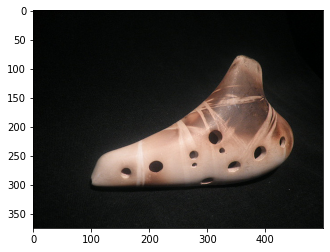

Keypoints = 301


In [10]:
plt.imshow(imgs[0])
plt.show()
imgs[0] = cv2.cvtColor(imgs[0], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[0])))

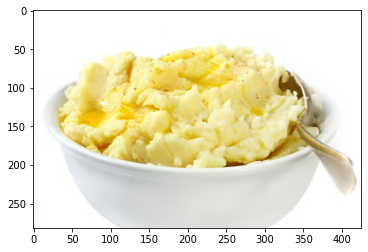

Keypoints = 506


In [11]:
plt.imshow(imgs[1])
plt.show()
imgs[1] = cv2.cvtColor(imgs[1], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[1])))

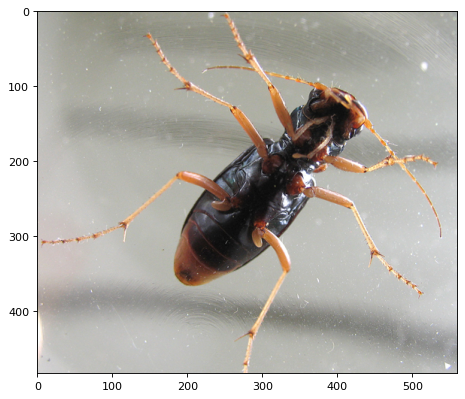

Keypoints = 776


In [12]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[2])
plt.show()
imgs[2] = cv2.cvtColor(imgs[2], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[2])))

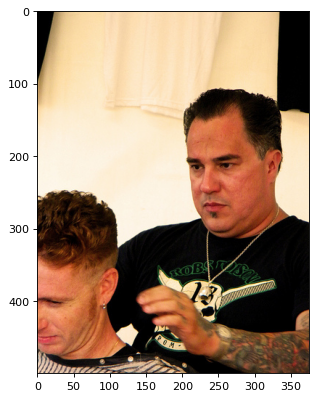

Keypoints = 982


In [13]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[3])
plt.show()
imgs[3] = cv2.cvtColor(imgs[3], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[3])))

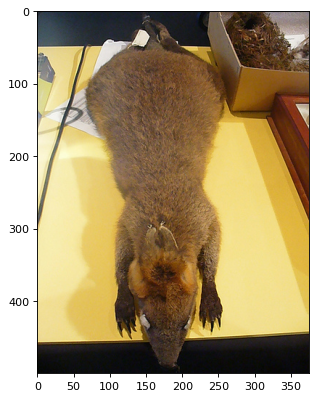

Keypoints = 1204


In [14]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[4])
plt.show()
imgs[4] = cv2.cvtColor(imgs[4], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[4])))

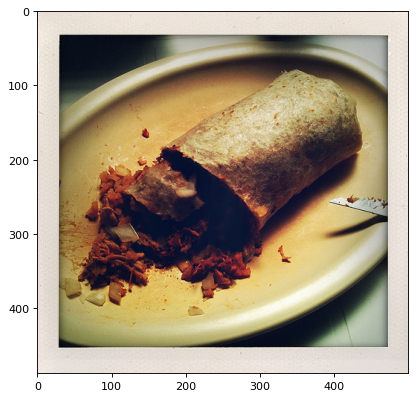

Keypoints = 1552


In [15]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[5])
plt.show()
imgs[5] = cv2.cvtColor(imgs[5], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[5])))

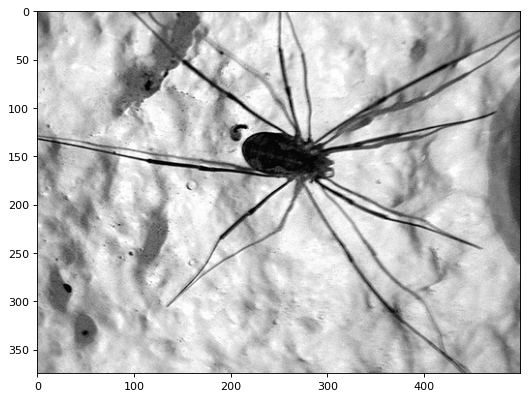

Keypoints = 1920


In [16]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[6])
plt.show()
imgs[6] = cv2.cvtColor(imgs[6], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[6])))

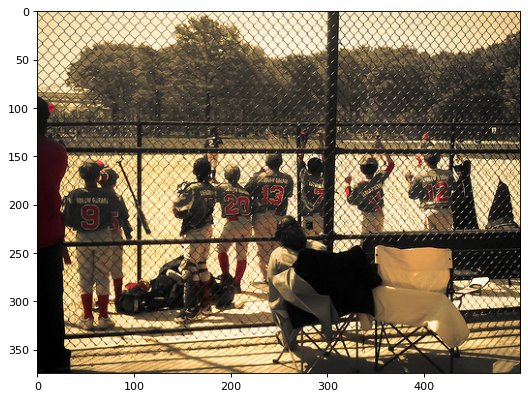

Keypoints = 2276


In [17]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[7])
plt.show()
imgs[7] = cv2.cvtColor(imgs[7], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[7])))

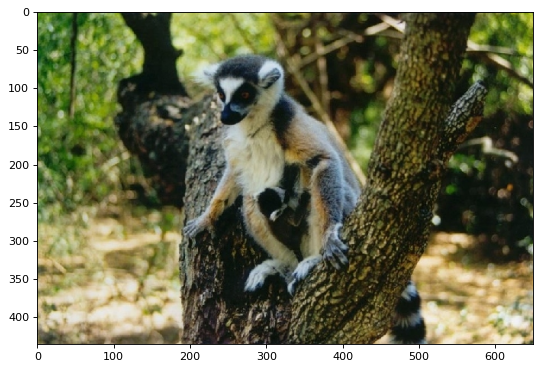

Keypoints = 2602


In [18]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[8])
plt.show()
imgs[8] = cv2.cvtColor(imgs[8], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[8])))

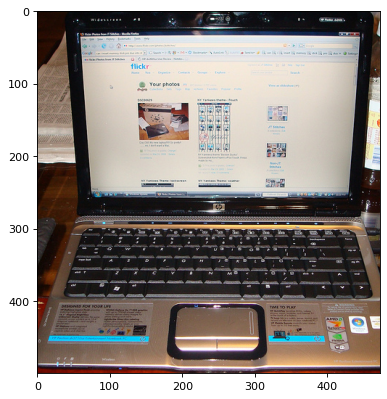

Keypoints = 3003


In [19]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[9])
plt.show()
imgs[9] = cv2.cvtColor(imgs[9], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[9])))

<font size="5">**High # keypoints images (>95% of images)**</font>

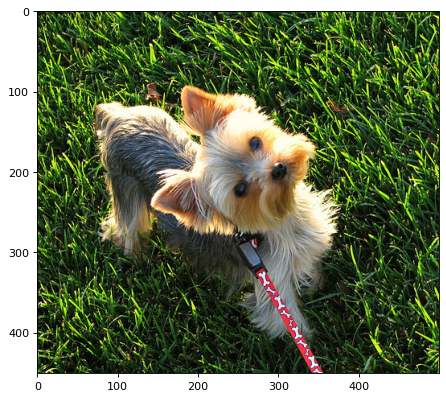

Keypoints = 3507


In [20]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[10])
plt.show()
imgs[10] = cv2.cvtColor(imgs[10], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[10])))

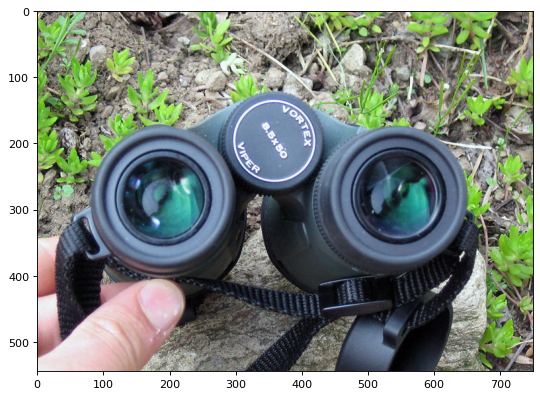

Keypoints = 4400


In [21]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[11])
plt.show()
imgs[11] = cv2.cvtColor(imgs[11], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[11])))

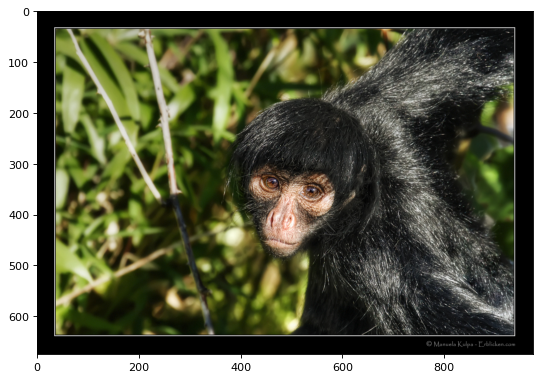

Keypoints = 5103


In [22]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[12])
plt.show()
imgs[12] = cv2.cvtColor(imgs[12], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[12])))

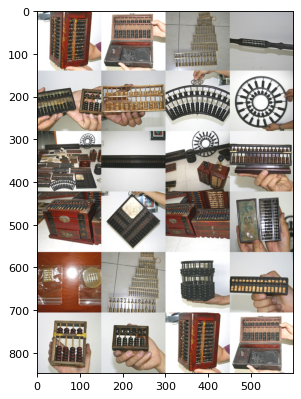

Keypoints = 6263


In [23]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[13])
plt.show()
imgs[13] = cv2.cvtColor(imgs[13], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[13])))

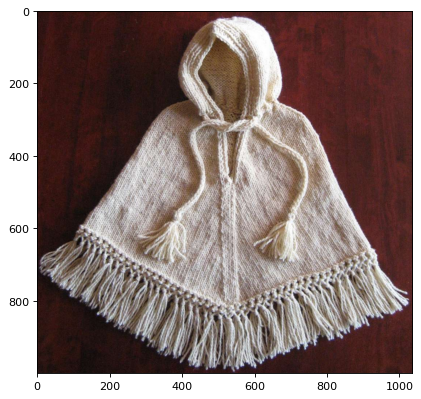

Keypoints = 7941


In [24]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[14])
plt.show()
imgs[14] = cv2.cvtColor(imgs[14], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[14])))

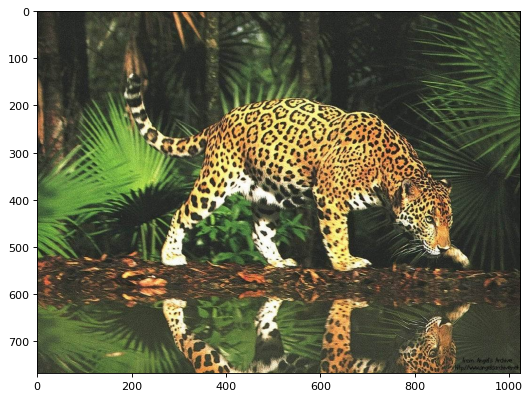

Keypoints = 9658


In [25]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[15])
plt.show()
imgs[15] = cv2.cvtColor(imgs[15], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[15])))

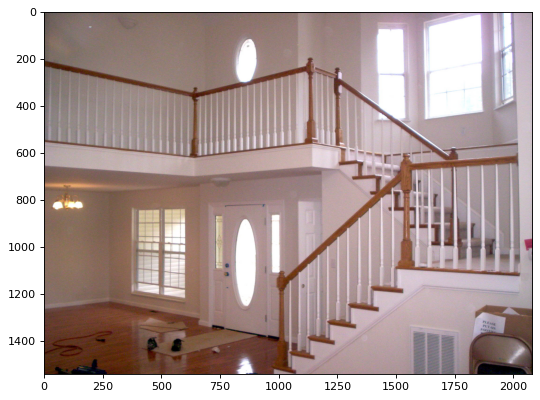

Keypoints = 12952


In [26]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[16])
plt.show()
imgs[16] = cv2.cvtColor(imgs[16], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[16])))

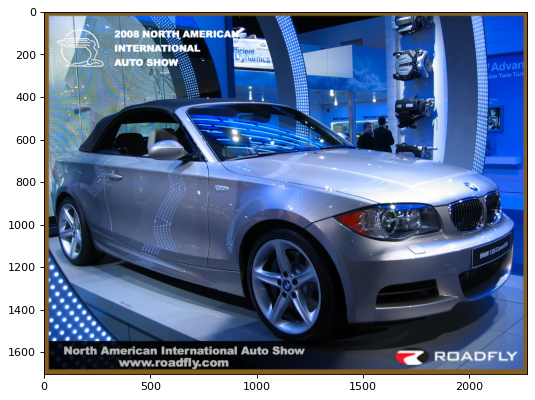

Keypoints = 20894


In [27]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[17])
plt.show()
imgs[17] = cv2.cvtColor(imgs[17], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[17])))

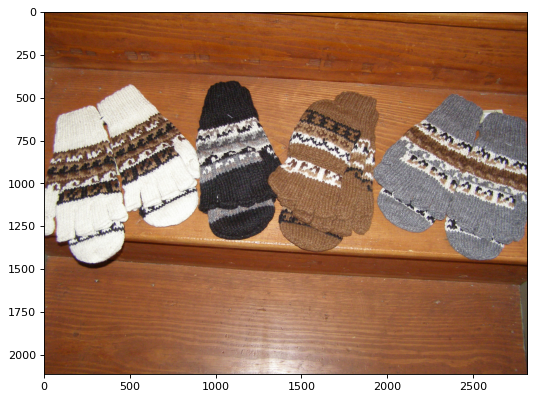

Keypoints = 30370


In [28]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[18])
plt.show()
imgs[18] = cv2.cvtColor(imgs[18], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[18])))

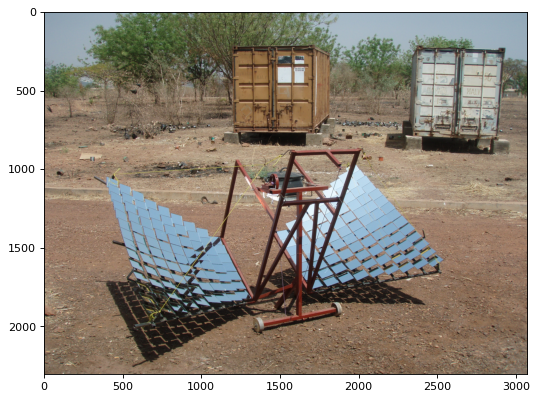

Keypoints = 73750


In [29]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[19])
plt.show()
imgs[19] = cv2.cvtColor(imgs[19], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[19])))

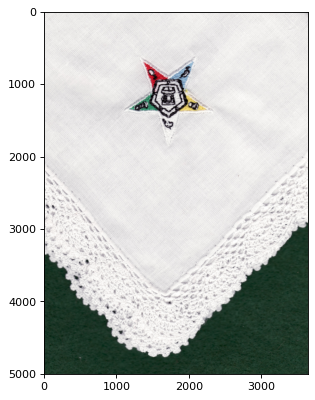

Keypoints = 123972


In [30]:
plt.figure(figsize=(8, 6), dpi=80)
plt.imshow(imgs[20])
plt.show()
imgs[20] = cv2.cvtColor(imgs[20], cv2.COLOR_RGB2BGR)
print('Keypoints = {}'.format(kp_surf(imgs[20])))

<font size="5">**Average perceived brightness**</font>

<font size="3">There is a number of ways to compute <font color = "green">average perceived brightness</font>, the following methods were tested. The formulas were obtained [here](https://www.generacodice.com/en/articolo/745094/What-are-some-methods-to-analyze-image-brightness-using-Python) for the first way, and [here](https://stackoverflow.com/questions/596216/formula-to-determine-brightness-of-rgb-color) for the second way.</font>

In [31]:
def brightness(img):
    #take the mean of RGB channels and use the formula to compute the value
    #1st formula
    
    B = np.mean(img[:, :, 0])
    G = np.mean(img[:, :, 1])
    R = np.mean(img[:, :, 2])
    
    average_perceived_brightness = (math.sqrt(0.241*(R**2) + 0.691*(G**2) + 0.068*(B**2)))
    return average_perceived_brightness

    #2nd formula
    #average_perceived_brightness = 0.299*(R) + 0.587*(G) + 0.114*(B)
    #return average_perceived_brightness
    
    #Both methods show similar values

In [32]:
imgs = get_imgs([7883, 7735, 7886])[0]

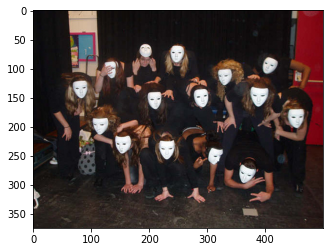

Average perceived brightness = 46.31


In [33]:
plt.imshow(imgs[0])
plt.show()
print('Average perceived brightness = {:.2f}'.format(brightness(imgs[0])))

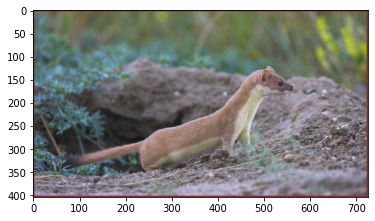

Average perceived brightness = 113.5660388621275


In [34]:
plt.imshow(imgs[1])
plt.show()
print('Average perceived brightness = {}'.format(brightness(imgs[1])))

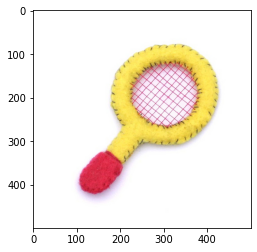

Average perceived brightness = 236.12


In [35]:
plt.imshow(imgs[2])
plt.show()
print('Average perceived brightness = {:.2f}'.format(brightness(imgs[2])))

<font size="3">It appears that the <font color = "green">average perceived brightness</font> is calculated correctly, by looking at these images and other examples from *Aspect_ratio, area_by_perim, average_perceived_brightness.ipynb* file.</font>

<font size="5">**Aspect ratio and area by perimeter**</font>

<font size="3">For <font color = "green">area by perimeter</font> and <font color = "green">aspect ratio</font>, the *bounding box* of the object in the image was used. The bounding box values were taken from the *xml files* of the *dataset*. It is shown in the *Aspect_ratio, area_by_perim, average_perceived_brightness.ipynb* file, that they show the bounding box correctly. Below are the formulas for aspect ratio and area by perimeter. Since these are well-defined formulas, they most likely are not the source of error.</font>

In [36]:
width = 350      # values as an example, in the feature_extractor.py file, the width and height of the bounding box were used
height = 500

aspect_ratio = width / height                     # aspect ratio  

area_by_perim = (height * width) / ((height + width) * 2)    # area by perimeter

print("Aspect ratio = {}, area by perimeter = {}".format(aspect_ratio, area_by_perim))

Aspect ratio = 0.7, area by perimeter = 102.94117647058823


In [37]:
imgs = get_imgs([4940, 18920, 16111, 19675, 39130, 39117])[0]
img_path_list = get_imgs([4940, 18920, 16111, 19675, 39130, 39117])[1]

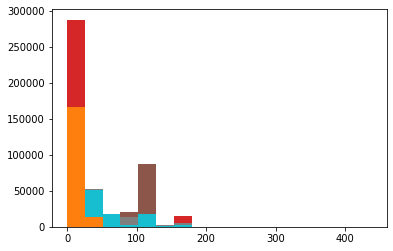

In [38]:
features_list = []                            # this list hold features of all 50k images

for i in range(len(img_path_list)):
    filename = img_path_list[i]
    features_list.append(feature_extractor.extract_features(filename))

In [39]:
# adding a green rectangle for images' bounding boxes
for i in range(len(imgs)):
    imgs[i] = cv2.rectangle(imgs[i], (features_list[i][7][0], features_list[i][7][2]),
                            (features_list[i][7][1], features_list[i][7][3]), (0,255,0), 2)

<font size="3">For aspect ratio, the more <font color = "green">square</font> the bounding box is, the closer the value will be to one. For *tall* bounding boxes, the value will be *smaller*, and for *wide* bounding boxes, the value will be *bigger*.</font>

<font size="5">**Aspect ratio examples**</font>

Aspect ratio = 0.9798657718120806


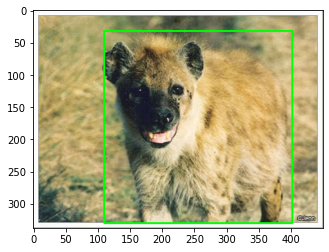

In [40]:
plt.imshow(imgs[0])
print("Aspect ratio = {}".format(features_list[0][4]))

Aspect ratio = 0.3795180722891566


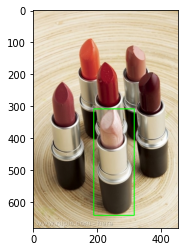

In [41]:
plt.imshow(imgs[1])
print("Aspect ratio = {}".format(features_list[1][4]))

Aspect ratio = 6.5394736842105265


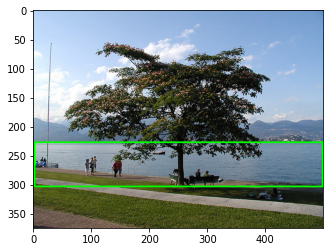

In [42]:
plt.imshow(imgs[2])
print("Aspect ratio = {}".format(features_list[2][4]))

<font size="3">Generally, for <font color = "green">area by perimeter</font>, for a *given perimeter*, the rectangle with the largest area will be a square. However, if the bounding box is *bigger*, the value will also be *higher*.</font>

<font size="5">**Area by perimeter examples**</font>

Area by perimeter = 12.162162162162161


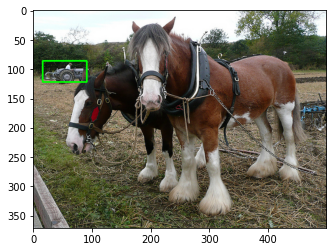

In [43]:
plt.imshow(imgs[3])
print("Area by perimeter = {}".format(features_list[3][3]))

Area by perimeter = 38.23529411764706


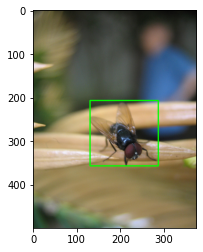

In [44]:
plt.imshow(imgs[4])
print("Area by perimeter = {}".format(features_list[4][3]))

Area by perimeter = 97.28179551122194


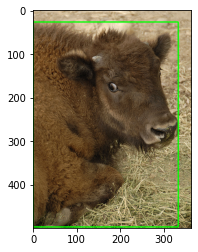

In [45]:
plt.imshow(imgs[5])
print("Area by perimeter = {}".format(features_list[5][3]))

<font size="5">**Contrast**</font>

<font size="3">To find <font color = "green">contrast</font>, [the RMS contrast](https://stackoverflow.com/questions/58821130/how-to-calculate-the-contrast-of-an-image) definition (standard deviation of pixel intensities) was used.</font>

In [46]:
def contrast(img):
    imgGrey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    contrast = imgGrey.std()
    return contrast

In [47]:
imgs = get_imgs([37063, 37083, 16938])[0]

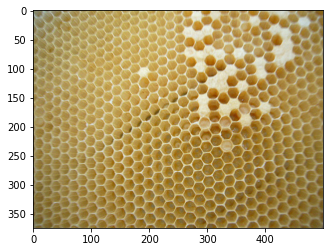

Contrast = 35.53664871545916


In [48]:
plt.imshow(imgs[0])
plt.show()
print('Contrast = {}'.format(contrast(imgs[0])))

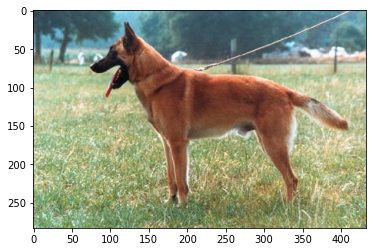

Contrast = 48.03062803130849


In [49]:
plt.imshow(imgs[1])
plt.show()
print('Contrast = {}'.format(contrast(imgs[1])))

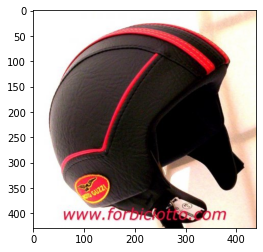

Contrast = 104.19991553838086


In [50]:
plt.imshow(imgs[2])
plt.show()
print('Contrast = {}'.format(contrast(imgs[2])))

<font size="3">Looking at these examples, it appears that <font color = "green">contrast</font> is calculated correctly.</font>

<font size="5">**Edge length and hue**</font>

<font size="3">For <font color = "green">edge length</font> and <font color = "green">hue</font>, the *simplecv* version was tested, since authors mentioned in the paper that they used *simplecv* for feature extraction, along with *opencv*.</font>

In [51]:
# this is not in the feature_extractor.py file, but Adlet ran this code on his computer after
# installing simplecv and shared the edge length and hue csv file
# the version in the feature_extractor.py file contains the implementation that is similar to simplecv, which was also tested

# Edge length - divide edge lengths into a 7-bin histogram, and sum the values of the first three bins
'''
edge = EdgeHistogramFeatureExtractor(7)

edge_vecs = edge.extract(img)

edge_length = edge_vecs[0] + edge_vecs[1] + edge_vecs[2]
'''

# Hue - divide the hue into a 7-bin histogram, and sum the values of the first and seventh bins
'''
hue = HueHistogramFeatureExtractor(7)

hue_vecs = hue.extract(img)

hue = hue_vecs[0] + hue_vecs[6]
'''

'\nhue = HueHistogramFeatureExtractor(7)\n\nhue_vecs = hue.extract(img)\n\nhue = hue_vecs[0] + hue_vecs[6]\n'

<font size="3">Just like for <font color = "green">kp_surf</font>, these methods are implemented in the library itself, which means there *should be* no error there.</font>

<font size="3">Here are the implemented versions of the <font color = "green">edge length</font> and <font color = "green">hue</font> extractors.</font>

In [52]:
# Detecting edges and creating a 7-bin histogram of the edge lengths
def edge_length(img):
    edges = cv2.Canny(img, 100, 200)
    threshold = 100
    labeled, nr_objects = ndimage.label(edges > threshold) 
    unique, lengths = np.unique(labeled, return_counts=True)
    y_e, x_e, g = plt.hist(lengths[1:], bins = 7)
    #plt.xlabel("Edge length")
    #plt.ylabel("Count")
    plt.close()
    plt.imshow(edges, cmap = "gray")
    plt.show()
    edge_length1 = y_e[0]
    return edge_length1

<font size="5">**Edge length examples**</font>

In [53]:
imgs = get_imgs([18528, 18474, 18543])[0]

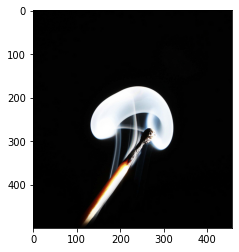

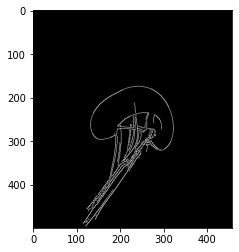

Edge length1 = 444.0


In [54]:
plt.imshow(imgs[0])
plt.show()
print('Edge length1 = {}'.format(edge_length(imgs[0])))

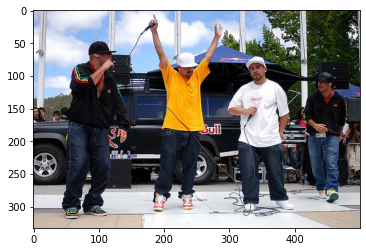

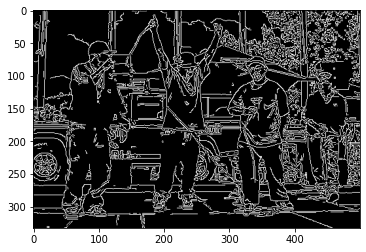

Edge length1 = 4555.0


In [55]:
plt.imshow(imgs[1])
plt.show()
print('Edge length1 = {}'.format(edge_length(imgs[1])))

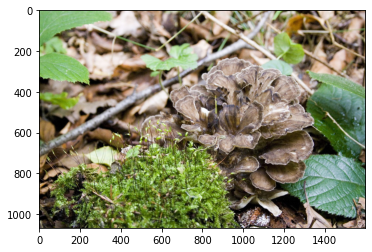

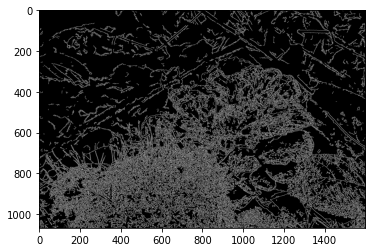

Edge length1 = 46449.0


In [56]:
plt.imshow(imgs[2])
plt.show()
print('Edge length1 = {}'.format(edge_length(imgs[2])))

In [57]:
# Creating a 7-bin histogram of hue
def hue(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV )
    hue, sat, val = cv2.split(hsv)
    hue = hue.flatten()
    y_h, x_h, bars = plt.hist(hue, bins = 7)
    plt.close()
    #plt.xlabel("Hue")
    #plt.ylabel("Count")
    hue1 = y_h[0]
    return hue1

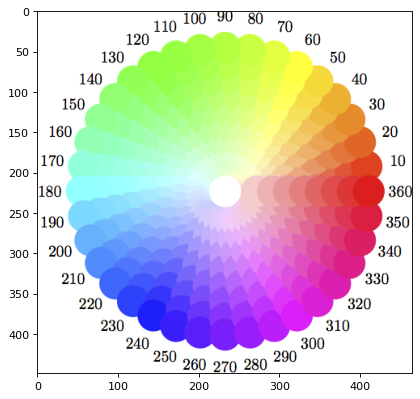

In [58]:
img = mpimg.imread('hue_range.png')
plt.figure(figsize=(8, 6), dpi=80)
imgplot = plt.imshow(img)
plt.show()

<font size="3">Since we are taking the *first* bin, we are looking for the <font color = "red">red</font> to <font color = "orange">orange</font> color range. The *more* pixels the image has in that range, the *higher* the value will be.</font>

<font size="5">**Hue examples**</font>

In [59]:
imgs = get_imgs([19053, 19046, 19164])[0]

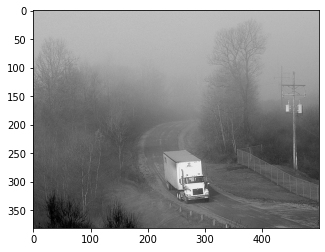

Hue1 = 0.0


In [60]:
plt.imshow(imgs[0])
plt.show()
imgs[0] = cv2.cvtColor(imgs[0], cv2.COLOR_RGB2BGR)
print('Hue1 = {}'.format(hue(imgs[0])))

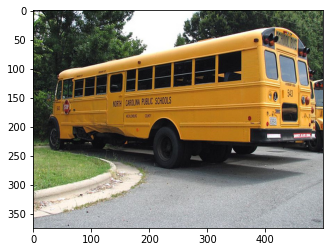

Hue1 = 70513.0


In [61]:
plt.imshow(imgs[1])
plt.show()
imgs[1] = cv2.cvtColor(imgs[1], cv2.COLOR_RGB2BGR)
print('Hue1 = {}'.format(hue(imgs[1])))

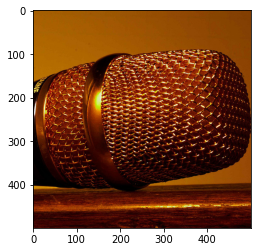

Hue1 = 211290.0


In [62]:
plt.imshow(imgs[2])
plt.show()
imgs[2] = cv2.cvtColor(imgs[2], cv2.COLOR_RGB2BGR)
print('Hue1 = {}'.format(hue(imgs[2])))

<font size="3">Since we are taking the *first* bin, we are looking for the <font color = "red">red</font> to <font color = "orange">orange</font> color range. The *more* pixels the image has in that range, the *higher* the value will be.</font>

<font size="3">The *implemented* <font color = "green">edge length</font> and <font color = "green">hue</font> extractors and *simplecv's* built-in extractors don't correlate. However, it seems that the best option is to use *simplecv* for extraction of these features, since authors also used *simplecv*.</font>

<font size="5">**Conclusion**</font>

<font size="3">To sum up, **kp_surf** must have been extracted properly, since it uses the same built-in SURF method that authors did.<br><br>**Aspect ratio** and **area by perimeter** also must have been extracted correctly, because their definitions are straightforward.<br><br>**Average perceived brightness** seems to have been implemented correctly, since it seems to be intuitively accurate when inspecting the images one by one, and *both formulas* used give similar results. It must be noted that there is a number of definitions of average perceived brightness, but these are the most common.<br><br>**Contrast** was extracted accoring to *RMS contrast definition*. By inspecting the images, it appears intuitively correct. It is possible that authors used a *different definition*, but it is not stated directly in the paper which definition they used.<br><br>**Edge length** and **hue** were extracted using *simplecv* since authors also used *simplecv*. It seems there isn't room for error, since these feature extractors are built-in.</font>